#### In this notebook the trained stationary model is tested on new dataset never seen by the model during the training. This dataset consists of the samples captured on different days but by the same webcams as the samples from the training dataset.

In [2]:
import numpy as np
import tensorflow as tf
import keras 
import keras.backend as K
from keras.layers import *
from keras.models import load_model,Model
import matplotlib.pyplot as plt
from scipy.misc import imresize
import pandas as pd
import os
import cv2
import datetime
from random import shuffle,sample
import math
from tqdm import tqdm
import re
import timeit
import matplotlib.pyplot as plt
from matplotlib.cbook import flatten
%matplotlib inline

Using TensorFlow backend.


##### First load the trained model for testing

In [3]:
test_model = load_model('mobile_mini_top_attention_1.h5',custom_objects={'relu6':ReLU(6.),'tf':tf},compile=False)

In [4]:
test_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, None, N 0                                            
__________________________________________________________________________________________________
mobilenetv2_1.00_224 (Model)    (None, None, None, 1 2257984     input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 1 11521       mobilenetv2_1.00_224[1][0]       
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 1)            0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
multiply_1

##### Redefining the model input and outputs such that models input is just a frame and the outputs are predicted values and self attention mask. This mask is interesting to look at in oder to understand what parts of the picture the model pays mostly attention to. Original model outputs weighted loss function but not predicted values themself. That's ok for training, but not good for inference. 

In [5]:
test_model=Model(inputs=[test_model.layers[0].input],outputs=[test_model.layers[4].output,test_model.layers[7].output])

In [6]:
test_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, None, N 0                                            
__________________________________________________________________________________________________
mobilenetv2_1.00_224 (Model)    (None, None, None, 1 2257984     input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 1 11521       mobilenetv2_1.00_224[1][0]       
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 1)            0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
multiply_1

##### Next two cells construct a list of all the videos (the pathes) of the test dataset and also a list of all csv-files with numerical data in the given directory. Here also the batch_size is definded, if later prediction on the batch is required. 

In [7]:
working_directory = '../new_data/'
batch_size=1

In [8]:
video_names = [root+'/'+file for root, _, files in os.walk(working_directory) for file in files if file.endswith('flv')]
csv_names   = [root+'/'+file for root, _, files in os.walk(working_directory) for file in files if file.endswith('csv')]

#### Creating one dataframe with numerical values collecting all the csv files together

In [9]:
wind_data=pd.DataFrame()
for path in csv_names:
    tabel=pd.read_csv(path,parse_dates=False)#.reset_index(drop=True)
    wind_data=pd.concat([wind_data,tabel]).reset_index(drop=True)

In [10]:
wind_data.tail()

,date,Avg. wind,wind gusts
708,2018-5-31-16-7,15,20
709,2018-5-31-16-12,16,19
710,2018-5-31-16-17,13,17
711,2018-5-31-16-22,12,17
712,2018-5-31-16-27,13,16


##### Function to get time stamp from the video name

In [11]:
def vn_to_time(vn):
    return datetime.datetime.strptime(vn.split('/')[-1].split('.')[0], '%Y-%m-%d-%H-%M')

##### testing the function

In [12]:
vn_to_time(video_names[0])

datetime.datetime(2018, 5, 26, 11, 58)

##### Function that produces the numerical values for given video. It finds two closest in time data points and makes interpolation. It also takes care of some edge cases.

In [13]:
def wind_for_video(vn,wind_data=wind_data):
    vid_time=vn_to_time(vn) #get the timestame for the given video
    
    wind_data["time_diff"]=wind_data['date'].apply(lambda x: #get the difference between time stamps of video and all datapoints
                                                   (datetime.datetime.strptime(x,'%Y-%m-%d-%H-%M')-vid_time).total_seconds())
    wind_data['time_dif_abs']=wind_data['time_diff'].apply(abs) #get absolute values of this difference
    wd=wind_data.sort_values(['time_dif_abs']).head(2).reset_index(drop=True) #get two closest datapoints
    
    if wd.empty:  
        return None
    if wd['time_dif_abs'].min()>500: # edge case when there is no datapoints closer than 500sec. 
                                     # No data will be produced for such a video
        return None
    
    elif wd['time_dif_abs'].max()>1000: # egde case when only one data point is close to the given video
        awind=wd['Avg. wind'].loc[wd['time_dif_abs'].idxmin()]
        gwind=wd['wind gusts'].loc[wd['time_dif_abs'].idxmin()]
    
    dt = wd['time_diff'].loc[1]-wd['time_diff'].loc[0]
    if abs(dt)<1:  # Edge case when two closest datapoints almost coinside 
        awind=(wd['Avg. wind'].loc[0]+wd['Avg. wind'].loc[1])/2
        gwind=(wd['wind gusts'].loc[0]+wd['wind gusts'].loc[1])/2
    else: # a regular case when there are two points to interpolate
        awind=(wd['Avg. wind'].loc[0]*wd['time_diff'].loc[1] - wd['Avg. wind'].loc[1]*wd['time_diff'].loc[0])/dt
        gwind=(wd['wind gusts'].loc[0]*wd['time_diff'].loc[1] - wd['wind gusts'].loc[1]*wd['time_diff'].loc[0])/dt
    return [awind,gwind]

##### testing the function

In [14]:
wind_for_video(video_names[100])

[11.0, 16.0]

##### Create a new dataframe with three columns - video path, and two corresponding numerical values as calculated using function above.

In [15]:
df_wind=pd.DataFrame()
for video in video_names:
    num_values=wind_for_video(video) 
    if num_values is None: #if there is no numerical value for the given video available, skip this video
        continue
    df=pd.DataFrame([[video]+num_values],columns=['video','av.wn.','wn.gs.'])
    df_wind=df_wind.append(df)
df_wind.reset_index(drop=True,inplace=True)

##### Using this dataframe makes it easy to select any subset of numerical values from the test dataset. For exapmple, we take only samples where average wind is less than 5. In this way we can check the performance of the model on any subset

In [16]:
df_wind[df_wind['av.wn.']<10].reset_index(drop=True).tail()

,video,av.wn.,wn.gs.
151,../new_data/new-tangana/2018-05-31-10-56.flv,6.8,11.6
152,../new_data/new-tangana/2018-05-31-10-8.flv,5.0,7.0
153,../new_data/new-tangana/2018-05-31-11-13.flv,9.4,12.0
154,../new_data/new-tangana/2018-05-31-11-2.flv,8.0,11.0
155,../new_data/new-tangana/2018-05-31-11-7.flv,9.0,12.0


##### Function that read one random frame from the given video as a numpy array. The frame is taken randomly between frame 0 and 300.

In [17]:
def read_frame(videoPath):
    count = 0
    vidcap = cv2.VideoCapture(videoPath)
    random_frame=np.random.randint(0,high=300) #generates random frame
    success = True
    while success:
        success,image = vidcap.read()
        if not success:
            return None
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if count >= random_frame:
            return image[:448,:704,:]
        count = count + 1

##### The generator that produces random sample of data from dataframe and then rerurns the true values together with one random frame from the corresponding video. A tuple of video frame in numpy format and numerical data is yield on each iteration. This generator is then can be used with the method "batch_predict_generator" for keras model

In [18]:
def batch_gen(data_frame=df_wind,batch_size=1):
    batch_frame=[]
    batch_data=[]
    while True:        
        df=list(data_frame.sample().values[0]) #sample the dataframe and create list from its values
        frame=read_frame(df[0]) #read sequence of frames for the given video
        num_dat=np.array([df[1],df[2]]) # get the numerical data for the video
        if df[1] is None or df[2] is None:
            continue
        if frame is None:
            continue
        batch_frame.append(frame/255.)
        batch_data.append(num_dat)
        if len(batch_frame)>=batch_size:
            yield np.stack(batch_frame),np.stack(batch_data) 
            batch_frame=[]
            batch_data=[]   

##### testing the generator

In [19]:
gen=batch_gen()

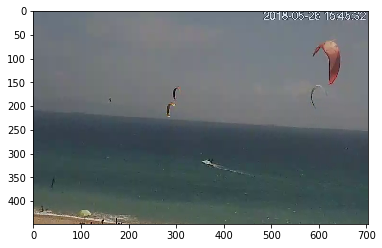

In [20]:
plt.imshow(np.squeeze(next(gen)[0]))

##### testing the stationary model on different subsets of the dataset. First, i define a generator that produces samples from the whole dataset.

In [21]:
gen=batch_gen(data_frame=df_wind)

##### Next cell produces 1) the prediction 2) the error as mean of the difference abs between predicted values and ground true values 3) Shows the picture corresponding to a sample and picture with overinposed attention mask to see what parts of the picture give most contribution into prediction 4) if the error less than 5, prediction is considered to be correct, otherwise incorrect. The current number of correct and incorrect predictions is given after each output

C:\Users\ttnnn\Anaconda3\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\ttnnn\Anaconda3\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


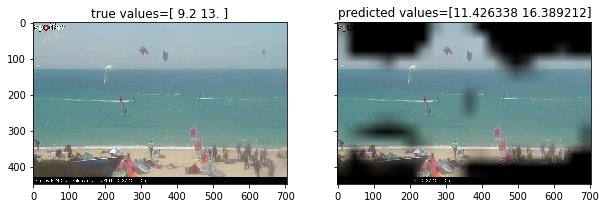

Correct! Error = 2.807774925231934
1 0


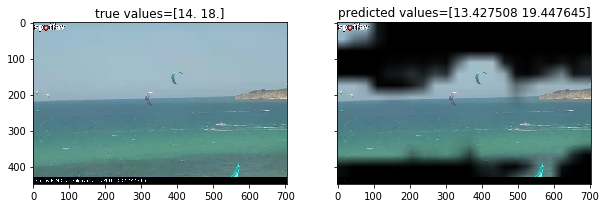

Correct! Error = 1.010068416595459
2 0


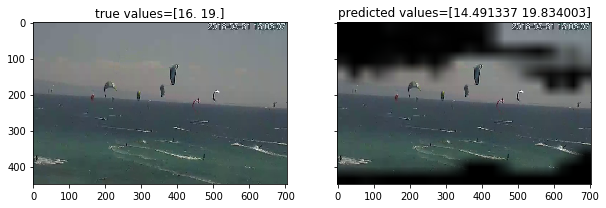

Correct! Error = 1.1713333129882812
3 0


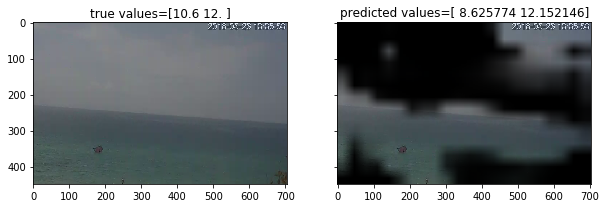

Correct! Error = 1.0631859779357908
4 0


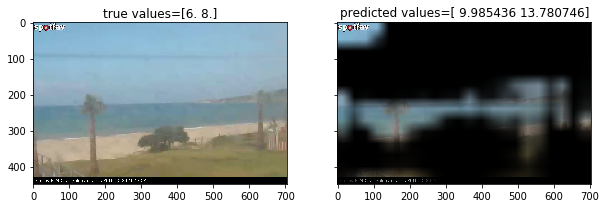

Correct! Error = 4.883091449737549
5 0


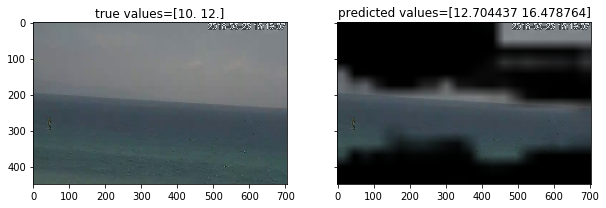

Correct! Error = 3.5916004180908203
6 0


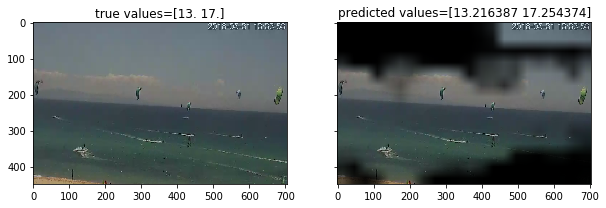

Correct! Error = 0.2353801727294922
7 0


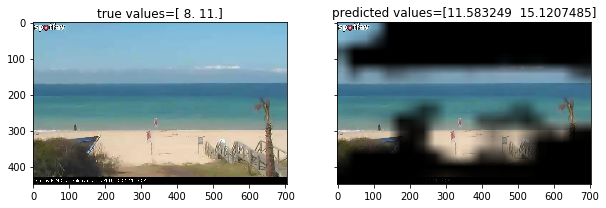

Correct! Error = 3.851998805999756
8 0


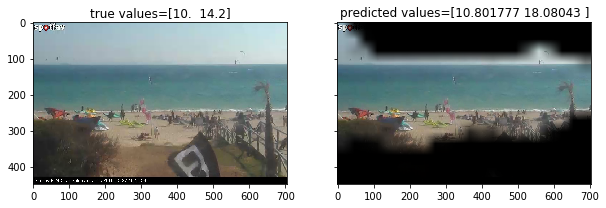

Correct! Error = 2.341102981567383
9 0


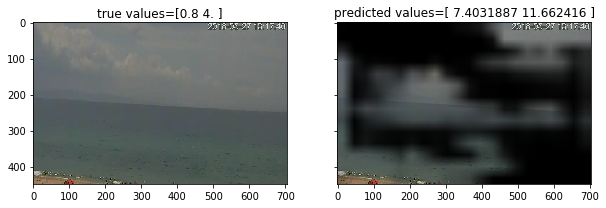

Incorrect! Error = 7.132802581787109
9 1


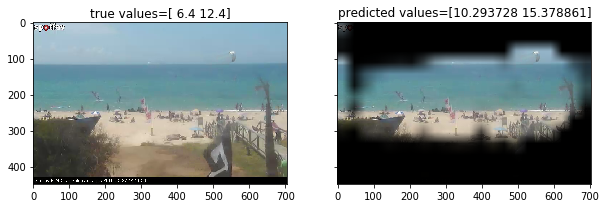

Correct! Error = 3.436294651031494
10 1


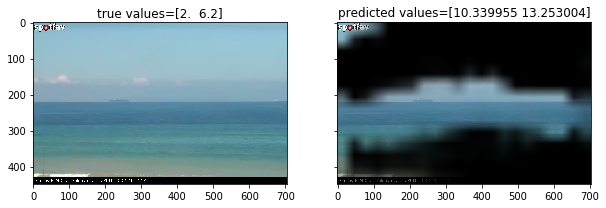

Incorrect! Error = 7.69647970199585
10 2


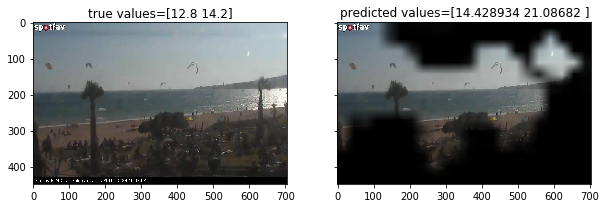

Correct! Error = 4.257877349853516
11 2


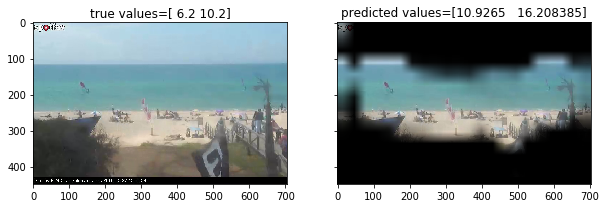

Incorrect! Error = 5.367442893981934
11 3


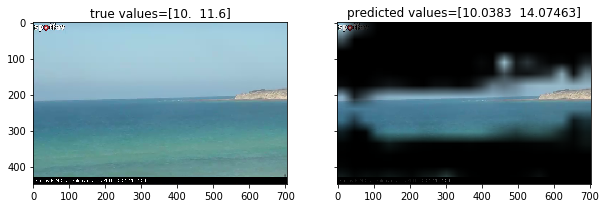

Correct! Error = 1.2564646720886232
12 3


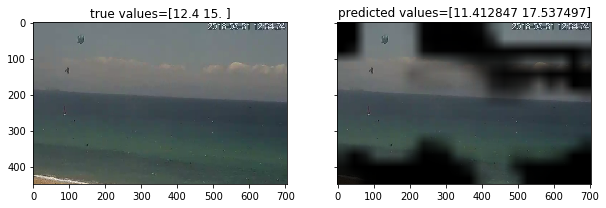

Correct! Error = 1.7623250007629396
13 3


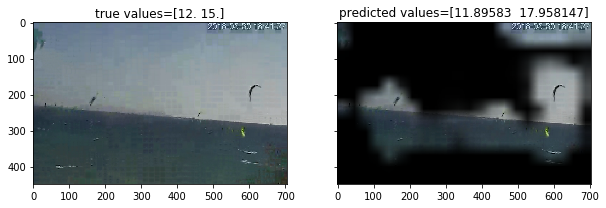

Correct! Error = 1.531158447265625
14 3


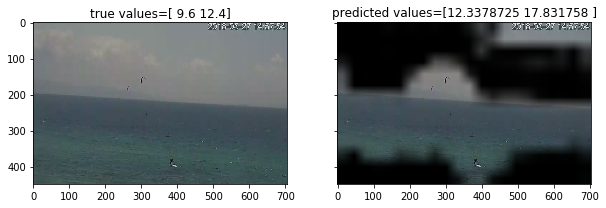

Correct! Error = 4.084815502166748
15 3


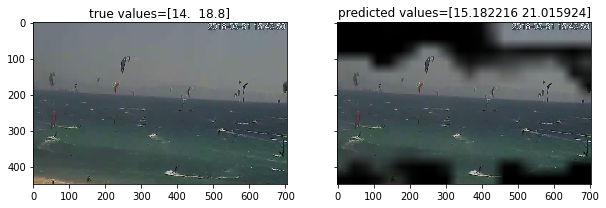

Correct! Error = 1.699070072174072
16 3


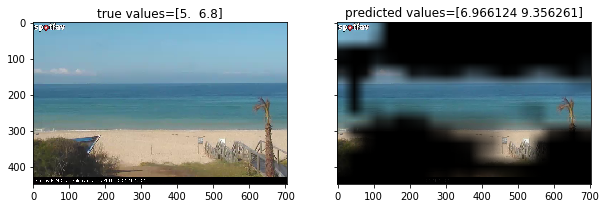

Correct! Error = 2.2611926555633546
17 3


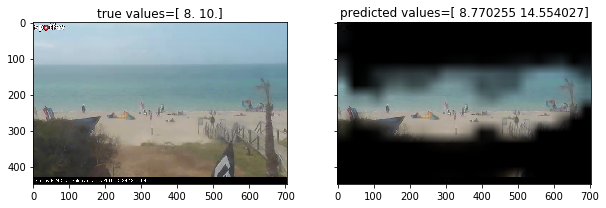

Correct! Error = 2.6621408462524414
18 3


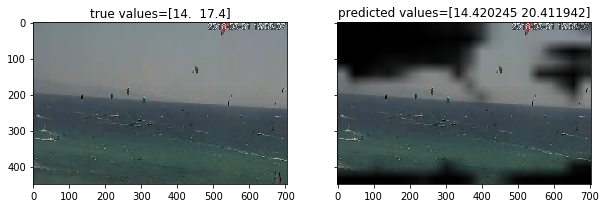

Correct! Error = 1.7160933494567878
19 3


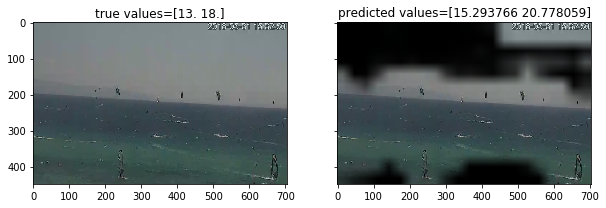

Correct! Error = 2.53591251373291
20 3


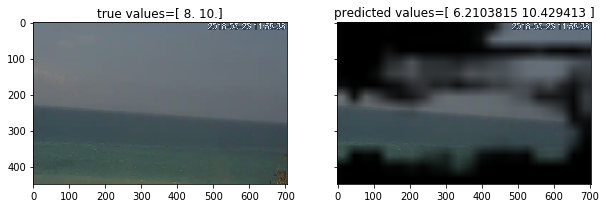

Correct! Error = 1.10951566696167
21 3


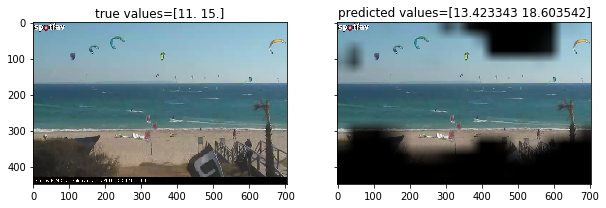

Correct! Error = 3.0134425163269043
22 3


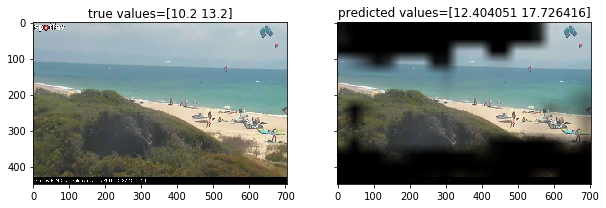

Correct! Error = 3.365233230590821
23 3


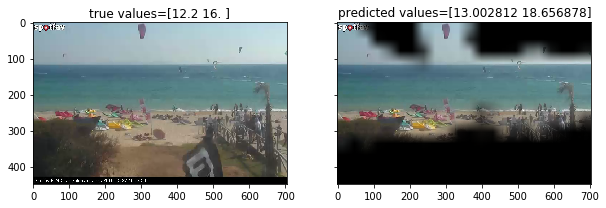

Correct! Error = 1.729844951629639
24 3


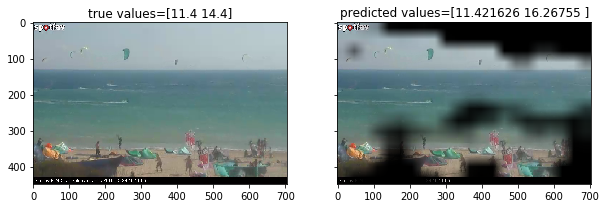

Correct! Error = 0.9445878028869625
25 3


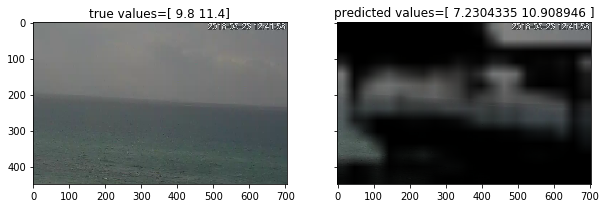

Correct! Error = 1.5303102493286138
26 3


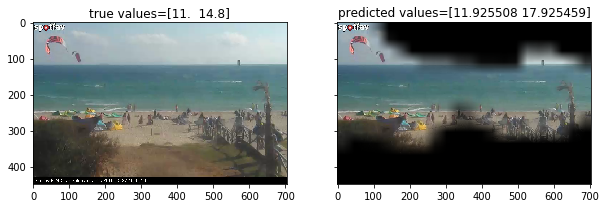

Correct! Error = 2.0254832267761227
27 3


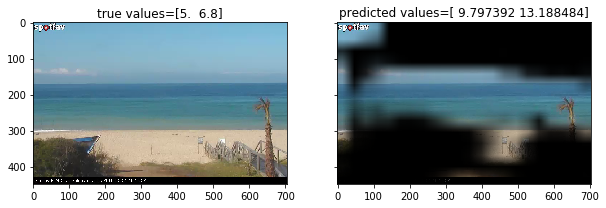

Incorrect! Error = 5.592938041687011
27 4


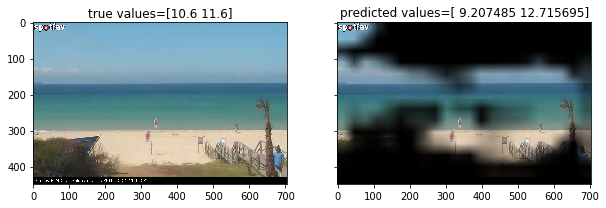

Correct! Error = 1.2541050910949707
28 4


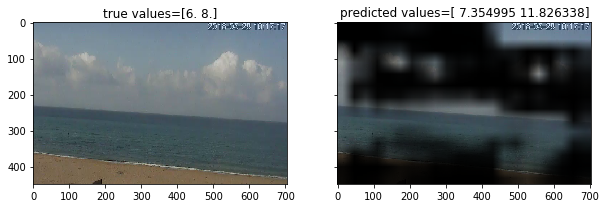

Correct! Error = 2.5906662940979004
29 4


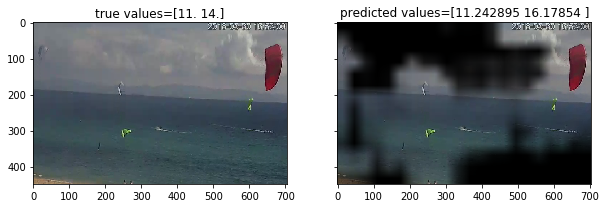

Correct! Error = 1.2107172012329102
30 4


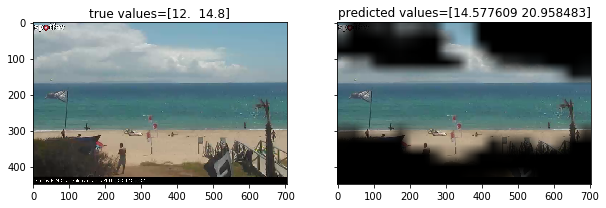

Correct! Error = 4.368045902252197
31 4


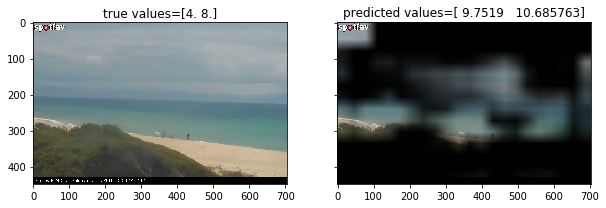

Correct! Error = 4.218831539154053
32 4


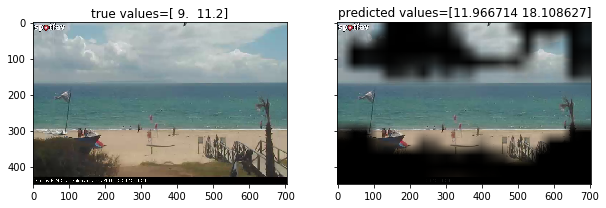

Correct! Error = 4.937670612335205
33 4


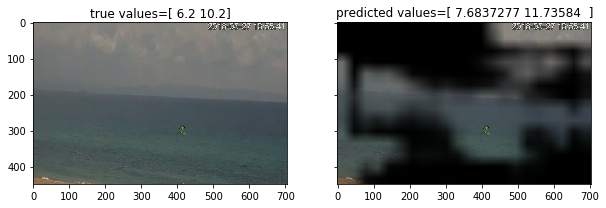

Correct! Error = 1.5097837924957278
34 4


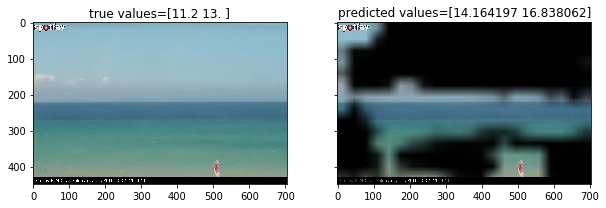

Correct! Error = 3.4011296272277836
35 4


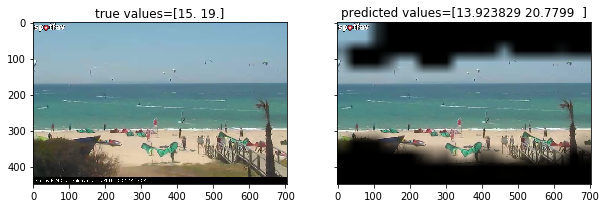

Correct! Error = 1.4280352592468262
36 4


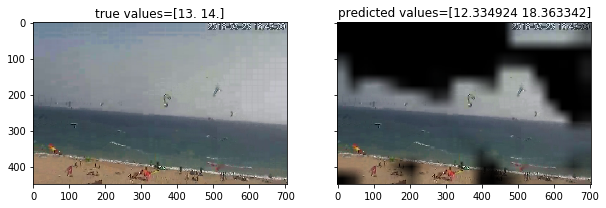

Correct! Error = 2.514209270477295
37 4


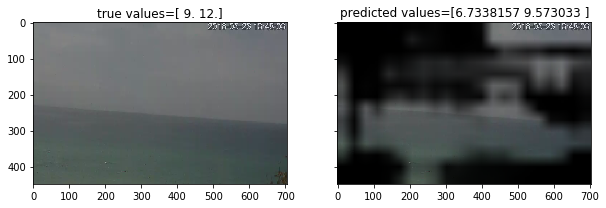

Correct! Error = 2.3465754985809326
38 4


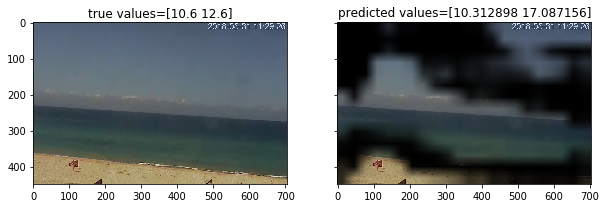

Correct! Error = 2.387129306793213
39 4


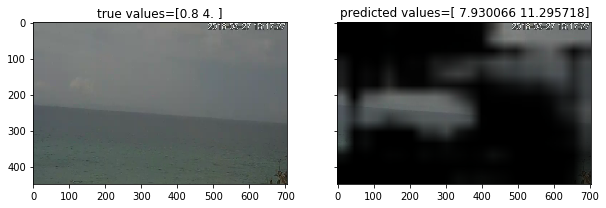

Incorrect! Error = 7.212892150878906
39 5


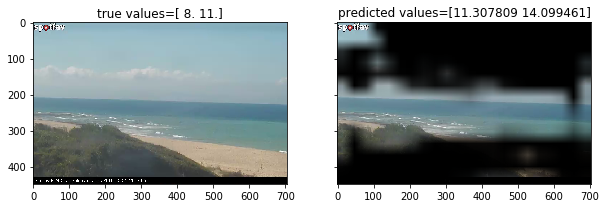

Correct! Error = 3.203634738922119
40 5


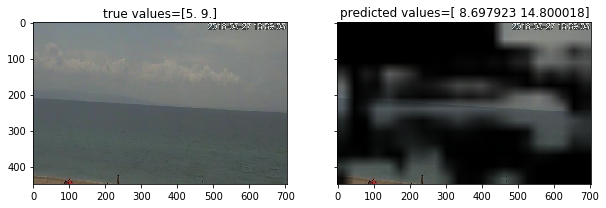

Correct! Error = 4.7489705085754395
41 5


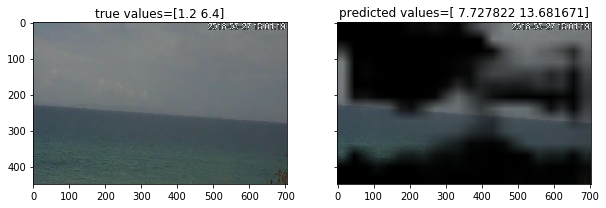

Incorrect! Error = 6.904746484756469
41 6


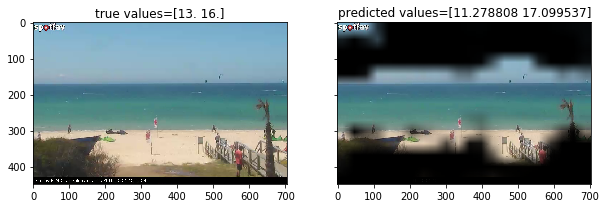

Correct! Error = 1.4103646278381348
42 6


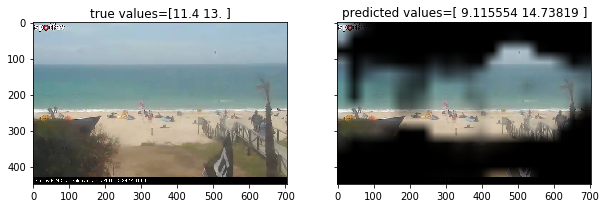

Correct! Error = 2.0113179206848146
43 6


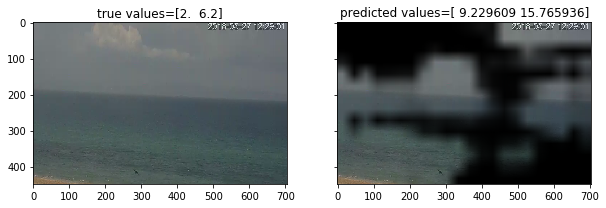

Incorrect! Error = 8.397772216796875
43 7


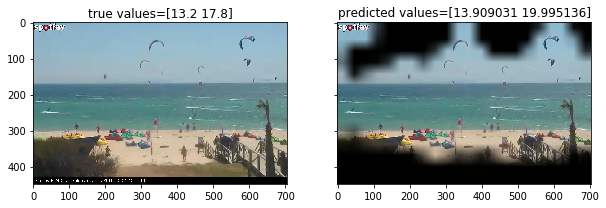

Correct! Error = 1.4520835876464844
44 7


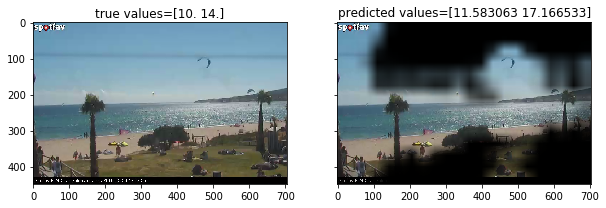

Correct! Error = 2.374797821044922
45 7


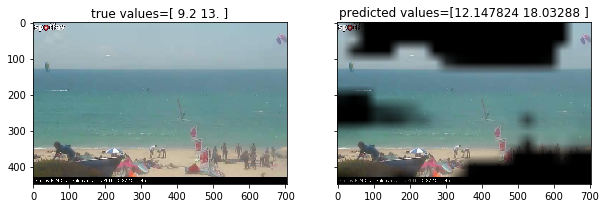

Correct! Error = 3.990352535247803
46 7


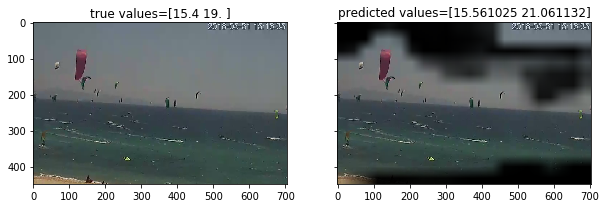

Correct! Error = 1.1110785484313963
47 7


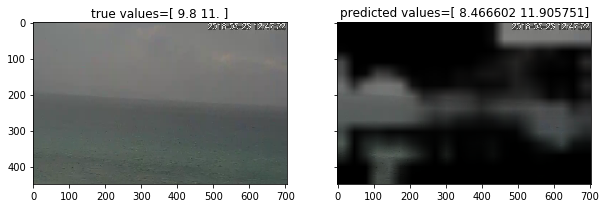

Correct! Error = 1.1195744514465336
48 7


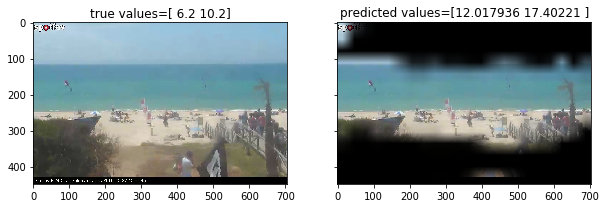

Incorrect! Error = 6.5100729942321784
48 8


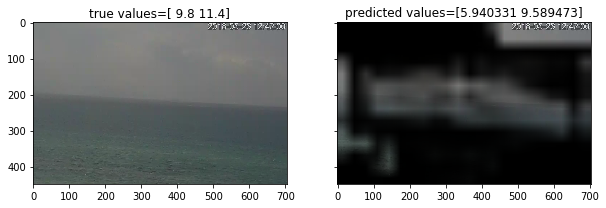

Correct! Error = 2.8350981235504156
49 8


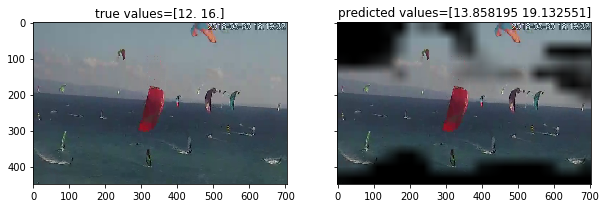

Correct! Error = 2.495373249053955
50 8


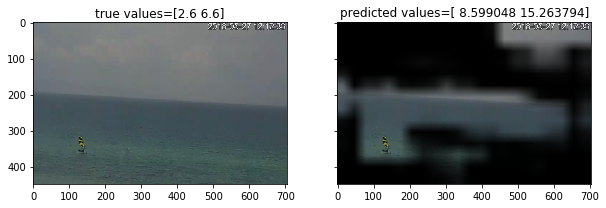

Incorrect! Error = 7.331420803070069
50 9


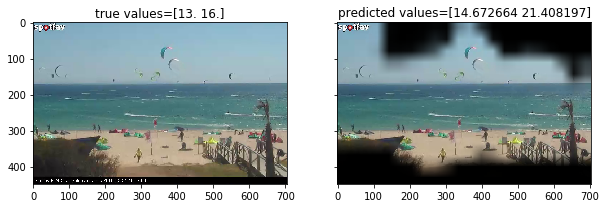

Correct! Error = 3.5404305458068848
51 9


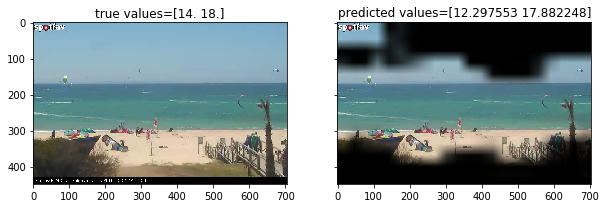

Correct! Error = 0.9100995063781738
52 9


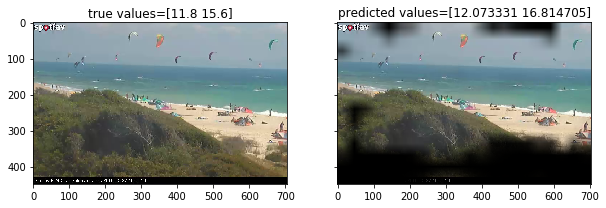

Correct! Error = 0.7440178871154783
53 9


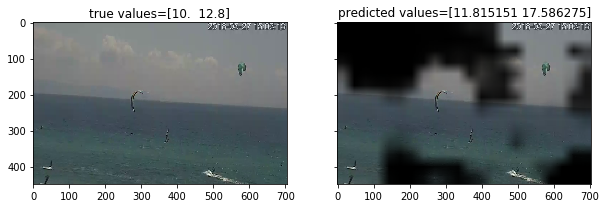

Correct! Error = 3.3007131576538082
54 9


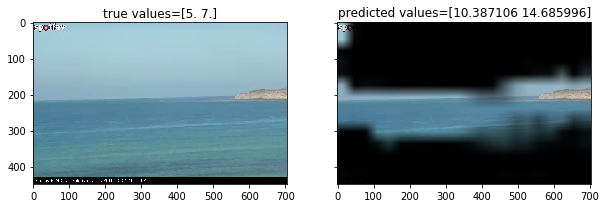

Incorrect! Error = 6.536550998687744
54 10


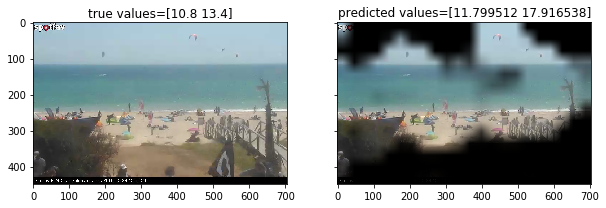

Correct! Error = 2.7580250740051264
55 10


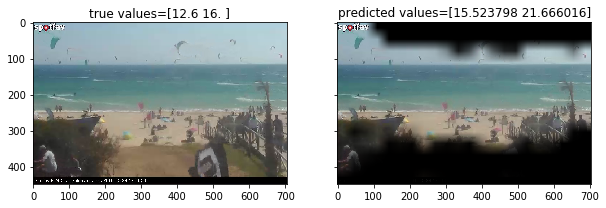

Correct! Error = 4.294906806945801
56 10


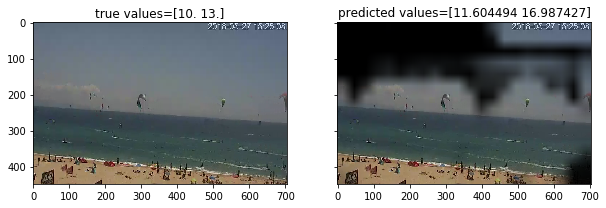

Correct! Error = 2.7959604263305664
57 10


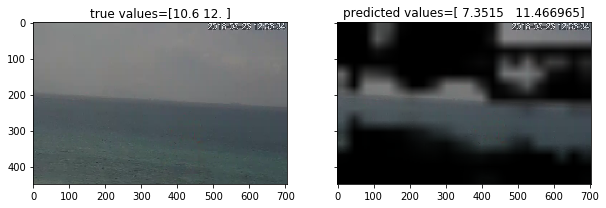

Correct! Error = 1.8907676219940184
58 10


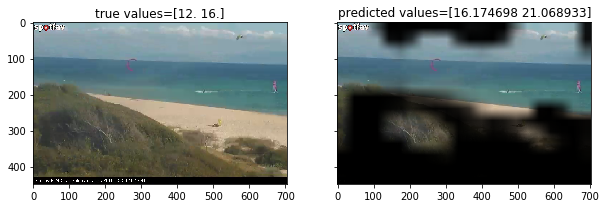

Correct! Error = 4.6218156814575195
59 10


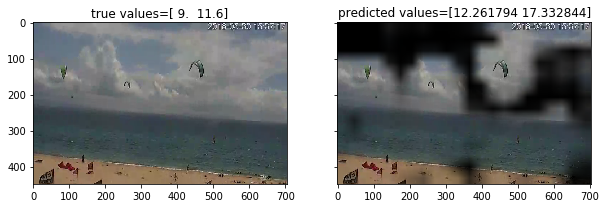

Correct! Error = 4.497318935394287
60 10


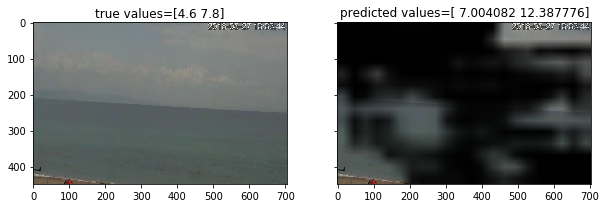

Correct! Error = 3.495929288864136
61 10


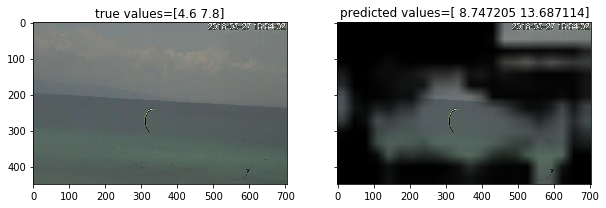

Incorrect! Error = 5.017159271240235
61 11


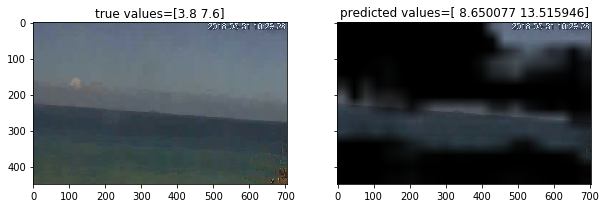

Incorrect! Error = 5.383011627197266
61 12


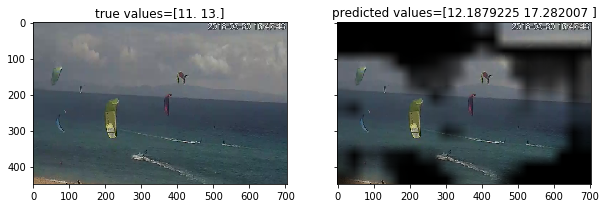

Correct! Error = 2.7349648475646973
62 12


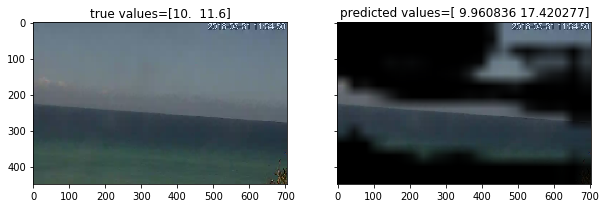

Correct! Error = 2.9297201156616213
63 12


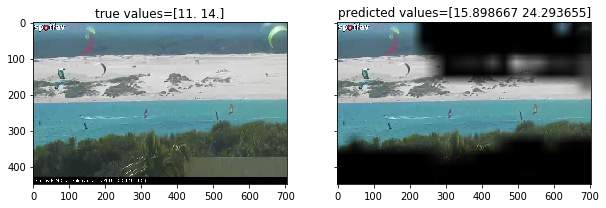

Incorrect! Error = 7.596161365509033
63 13


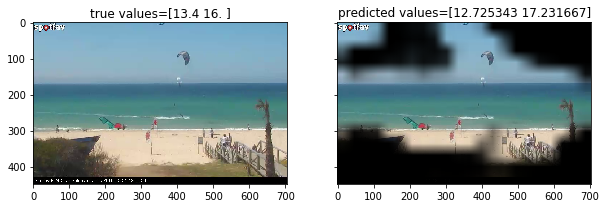

Correct! Error = 0.9531619071960451
64 13


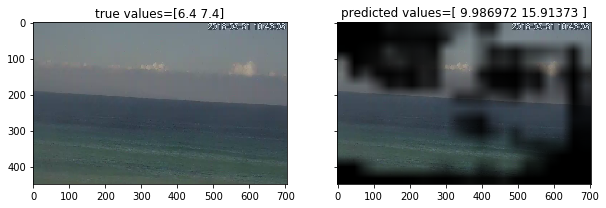

Incorrect! Error = 6.050350761413574
64 14


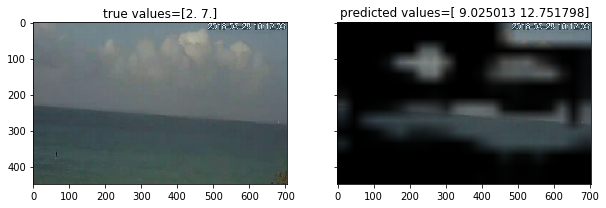

Incorrect! Error = 6.3884053230285645
64 15


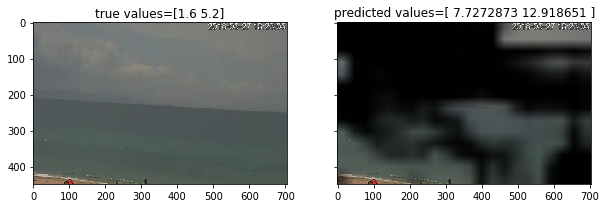

Incorrect! Error = 6.922968959808349
64 16


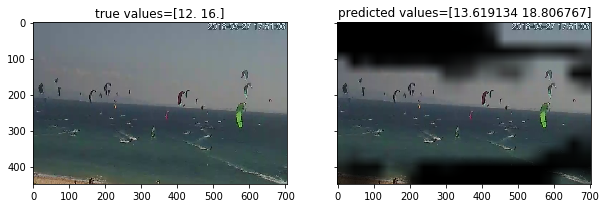

Correct! Error = 2.2129502296447754
65 16


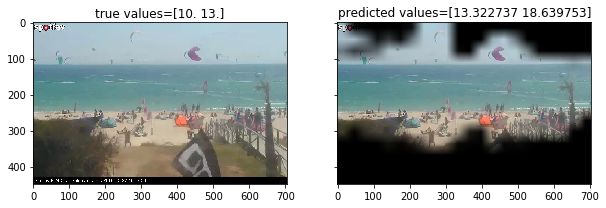

Correct! Error = 4.481245040893555
66 16


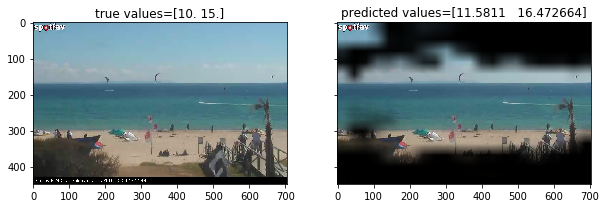

Correct! Error = 1.5268821716308594
67 16


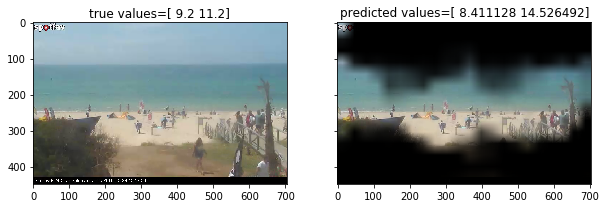

Correct! Error = 2.0576820373535156
68 16


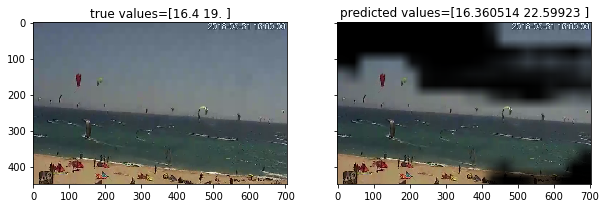

Correct! Error = 1.81935806274414
69 16


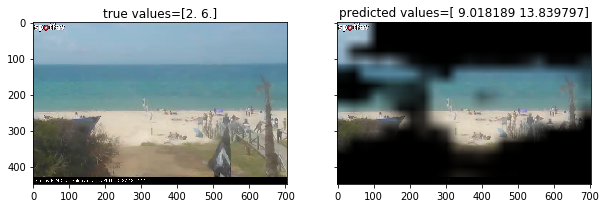

Incorrect! Error = 7.428993225097656
69 17


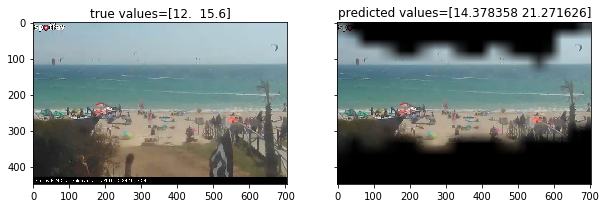

Correct! Error = 4.024991703033447
70 17


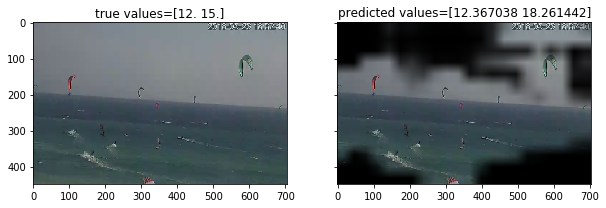

Correct! Error = 1.8142399787902832
71 17


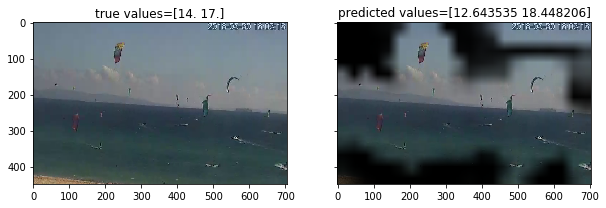

Correct! Error = 1.4023356437683105
72 17


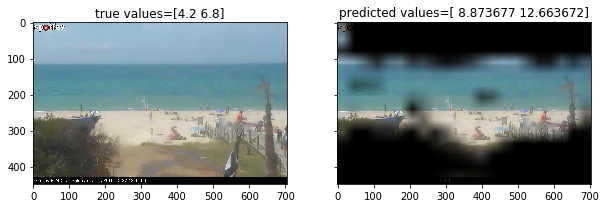

Incorrect! Error = 5.268674850463867
72 18


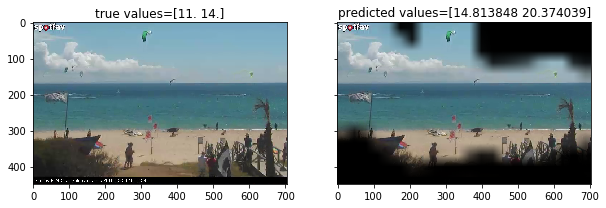

Incorrect! Error = 5.093943119049072
72 19


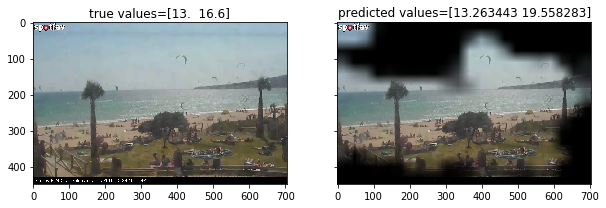

Correct! Error = 1.6108629226684563
73 19


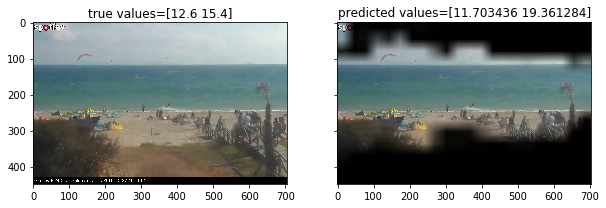

Correct! Error = 2.428924179077148
74 19


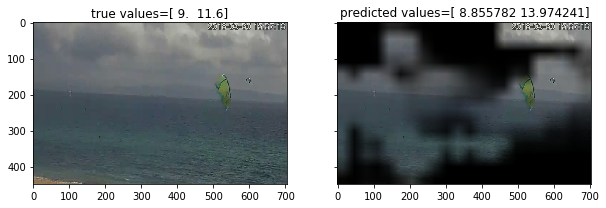

Correct! Error = 1.2592298507690431
75 19


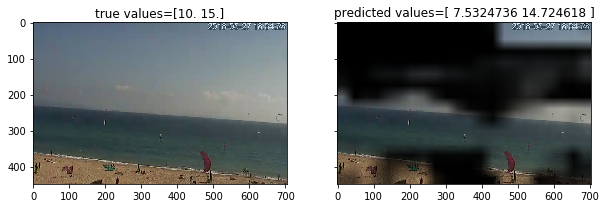

Correct! Error = 1.3714542388916016
76 19


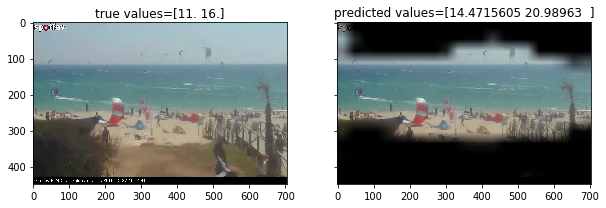

Correct! Error = 4.230595111846924
77 19


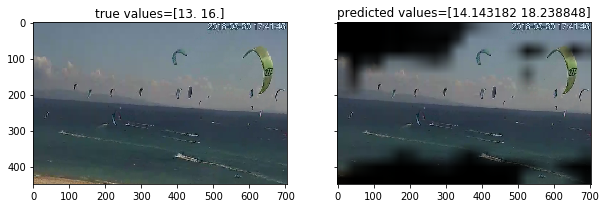

Correct! Error = 1.6910147666931152
78 19


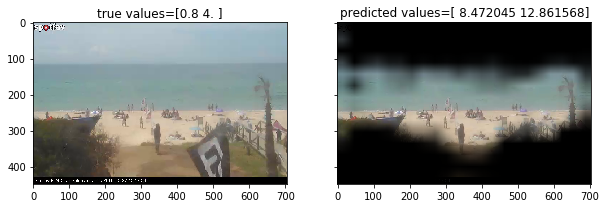

Incorrect! Error = 8.266806697845459
78 20


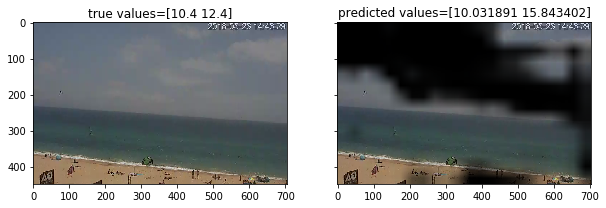

Correct! Error = 1.9057555198669434
79 20


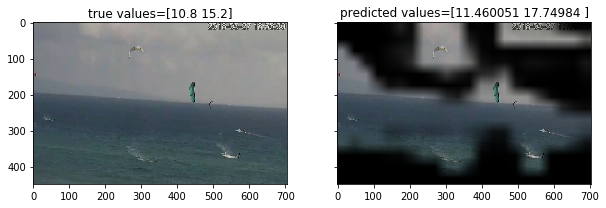

Correct! Error = 1.604945182800293
80 20


In [105]:
corr=0
incorr=0
for i in range(100):
    img,true_val=next(gen)
    prediction=test_model.predict(img)
    err=np.mean(np.abs(true_val-prediction[1]))
    
    #prediction1=stat_model.predict(img)
    maskedim=np.expand_dims(imresize(np.squeeze(prediction[0]/np.max(prediction[0])),img[0].shape[0:2]),axis=-1)*img/255.
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,20))
    ax1.imshow(np.squeeze(img))
    ax2.imshow(maskedim[0])
    ax1.set_title('true values={}'.format(np.squeeze(true_val)))
    ax2.set_title('predicted values={}'.format(np.squeeze(prediction[1])))
    plt.show()
    if err<5.:
        corr+=1
        print('Correct! Error = {}'.format(err))
    else:
        incorr+=1
        print('Incorrect! Error = {}'.format(err))
    print(corr, incorr)

##### For the whole test dataset the accuracy based on Monte-Carlo sampling method is about 80%. Next, I carry out the same test for the subset of the samples with values of avg.wind < 10knt

In [22]:
df=df_wind[df_wind['av.wn.']<10.]

C:\Users\ttnnn\Anaconda3\lib\site-packages\scipy\misc\pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if issubdtype(ts, int):
C:\Users\ttnnn\Anaconda3\lib\site-packages\scipy\misc\pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


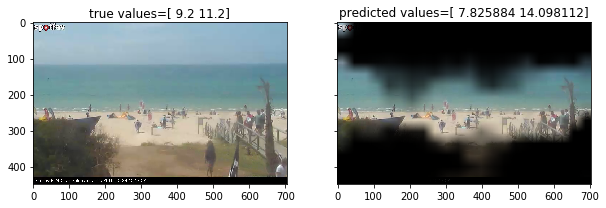

Correct! Error = 2.1361141204833984
1 0


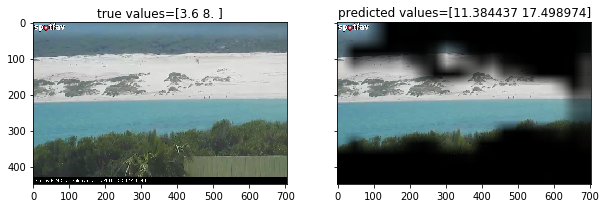

Incorrect! Error = 8.641705226898193
1 1


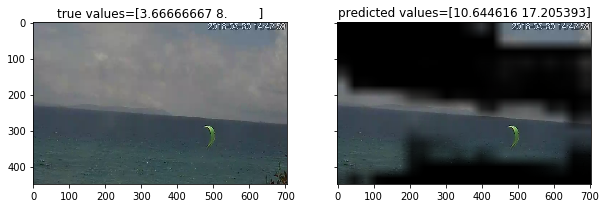

Incorrect! Error = 8.091671148935955
1 2


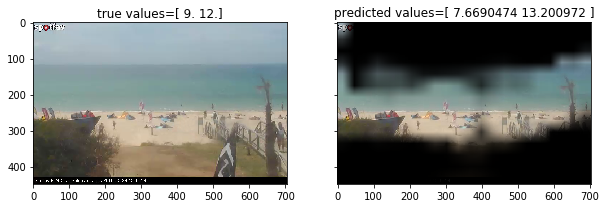

Correct! Error = 1.2659621238708496
2 2


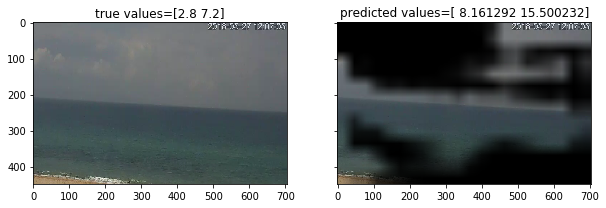

Incorrect! Error = 6.830761909484863
2 3


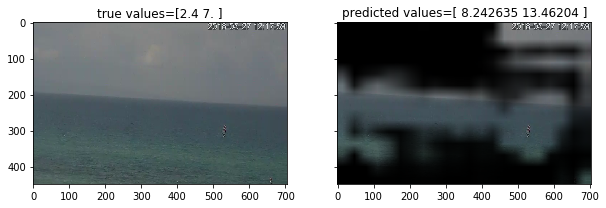

Incorrect! Error = 6.15233736038208
2 4


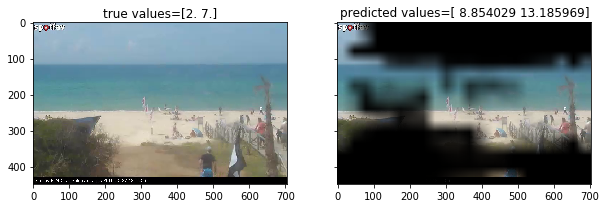

Incorrect! Error = 6.519999027252197
2 5


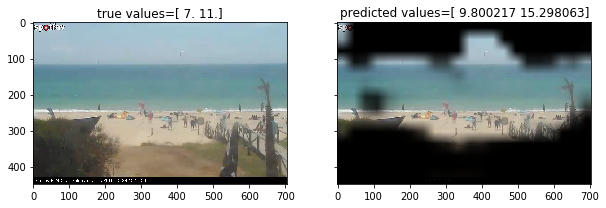

Correct! Error = 3.549139976501465
3 5


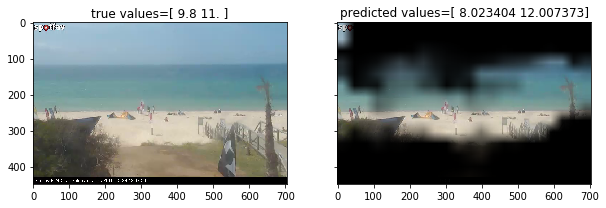

Correct! Error = 1.3919843673706058
4 5


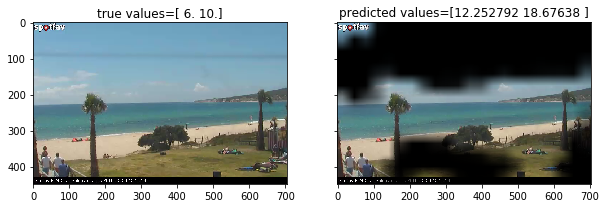

Incorrect! Error = 7.46458625793457
4 6


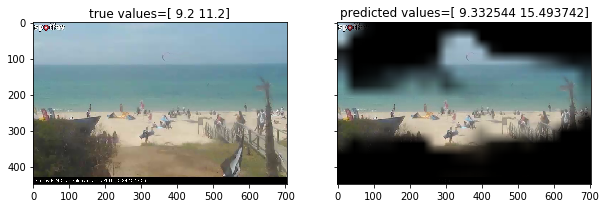

Correct! Error = 2.213143157958985
5 6


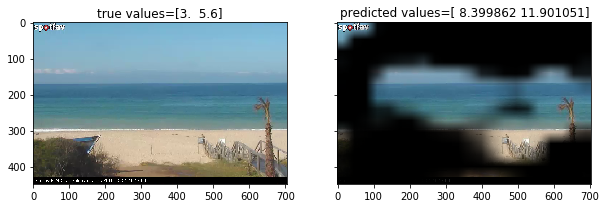

Incorrect! Error = 5.850456428527832
5 7


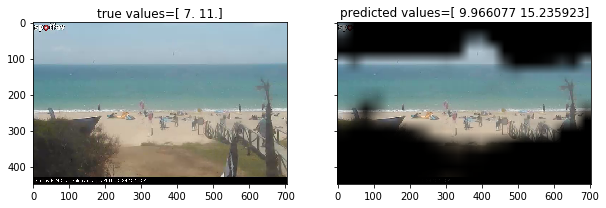

Correct! Error = 3.6009998321533203
6 7


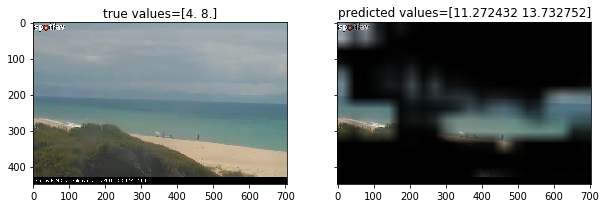

Incorrect! Error = 6.502592086791992
6 8


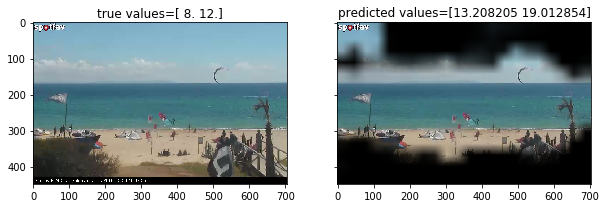

Incorrect! Error = 6.11052942276001
6 9


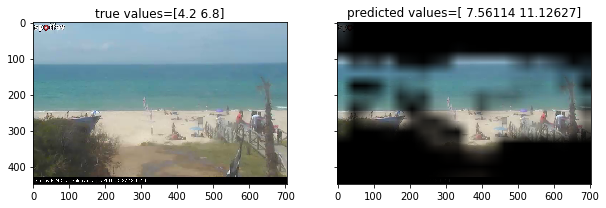

Correct! Error = 3.843705177307129
7 9


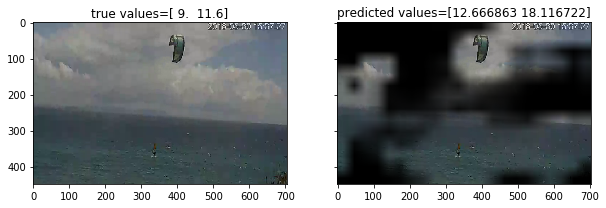

Incorrect! Error = 5.09179277420044
7 10


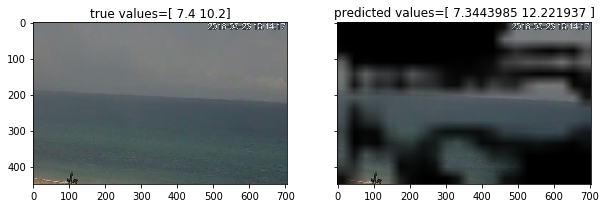

Correct! Error = 1.0387693405151373
8 10


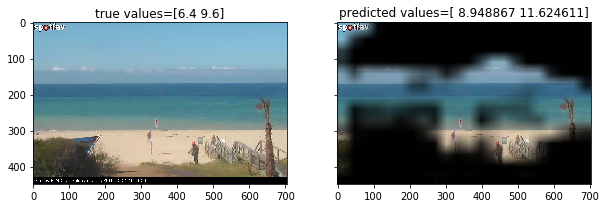

Correct! Error = 2.286738872528076
9 10


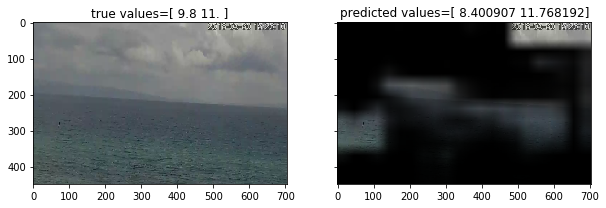

Correct! Error = 1.0836428642272953
10 10


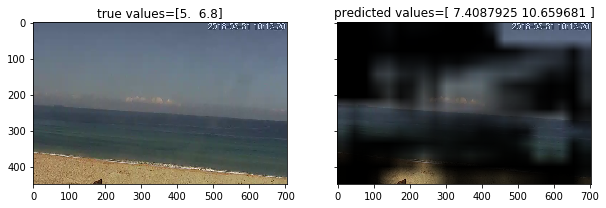

Correct! Error = 3.1342369079589845
11 10


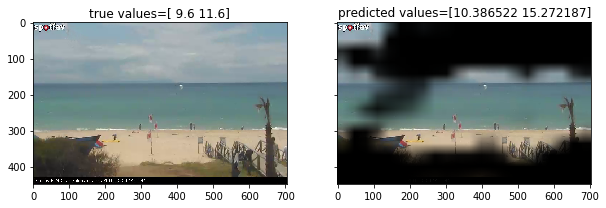

Correct! Error = 2.229354763031006
12 10


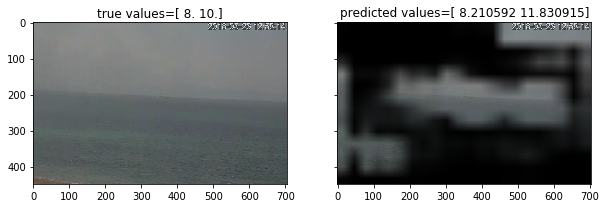

Correct! Error = 1.0207538604736328
13 10


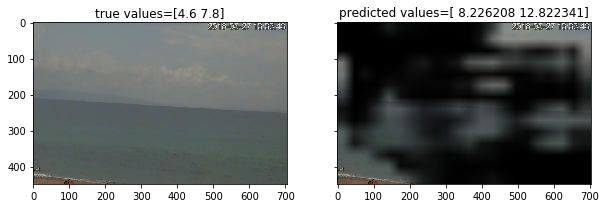

Correct! Error = 4.324274349212647
14 10


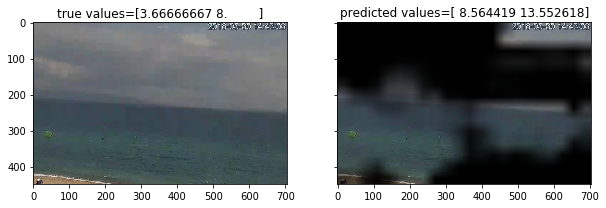

Incorrect! Error = 5.225185076395671
14 11


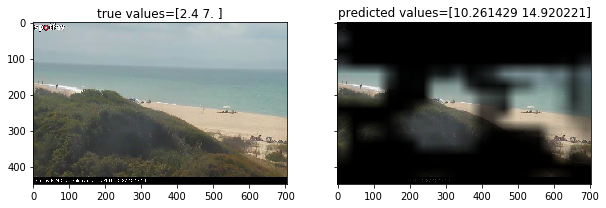

Incorrect! Error = 7.890825080871582
14 12


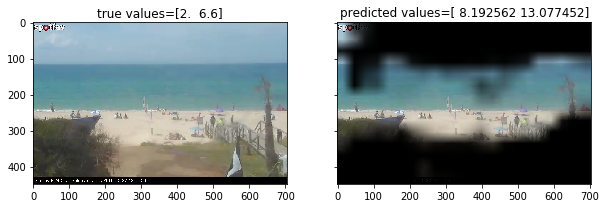

Incorrect! Error = 6.335006904602051
14 13


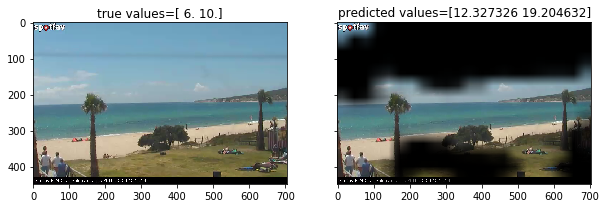

Incorrect! Error = 7.765978813171387
14 14


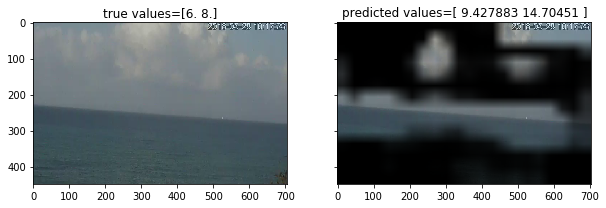

Incorrect! Error = 5.066196441650391
14 15


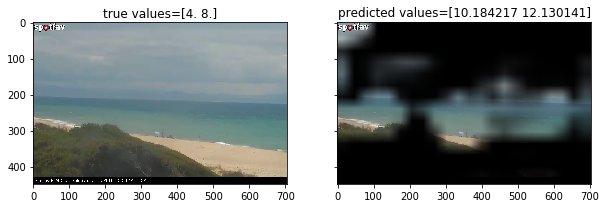

Incorrect! Error = 5.157179355621338
14 16


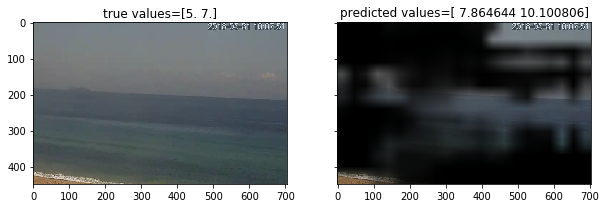

Correct! Error = 2.982725143432617
15 16


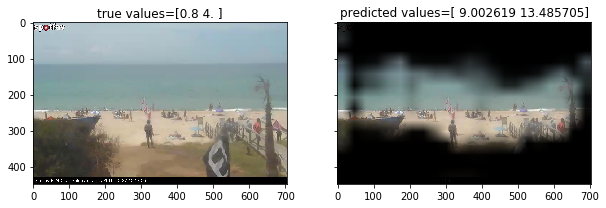

Incorrect! Error = 8.844162082672119
15 17


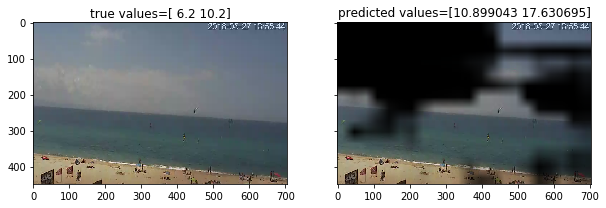

Incorrect! Error = 6.064869213104249
15 18


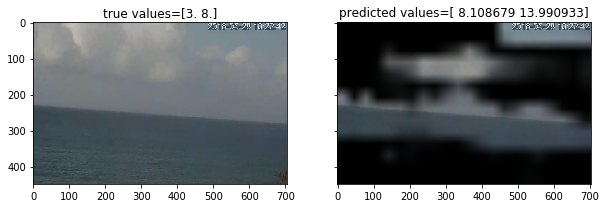

Incorrect! Error = 5.549806118011475
15 19


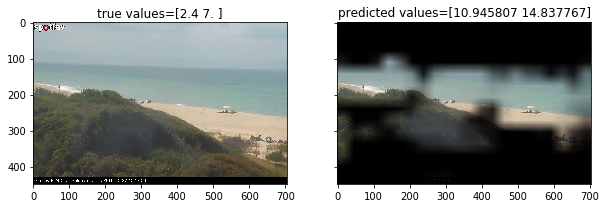

Incorrect! Error = 8.191787052154542
15 20


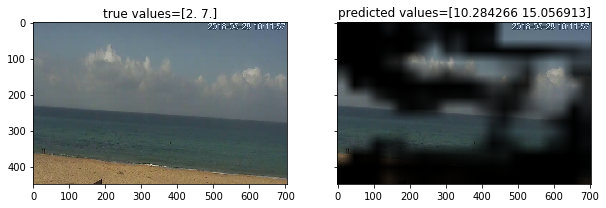

Incorrect! Error = 8.170589923858643
15 21


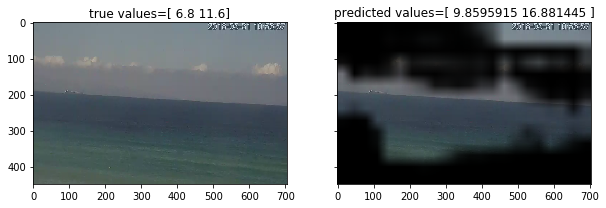

Correct! Error = 4.1705182075500495
16 21


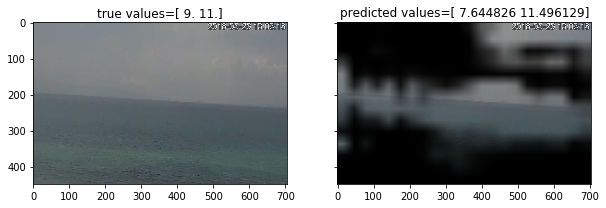

Correct! Error = 0.9256515502929688
17 21


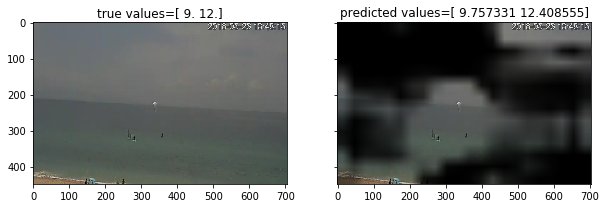

Correct! Error = 0.5829429626464844
18 21


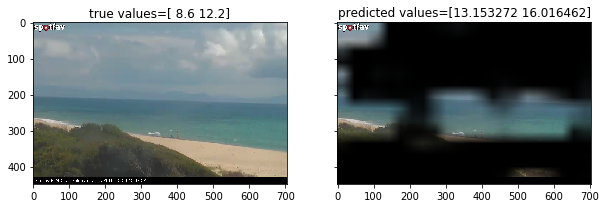

Correct! Error = 4.1848670005798345
19 21


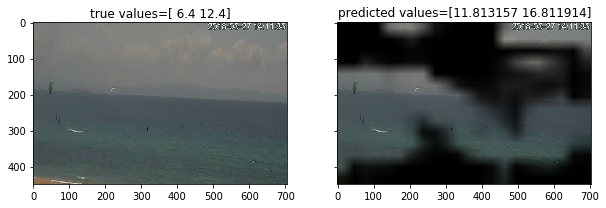

Correct! Error = 4.912535762786865
20 21


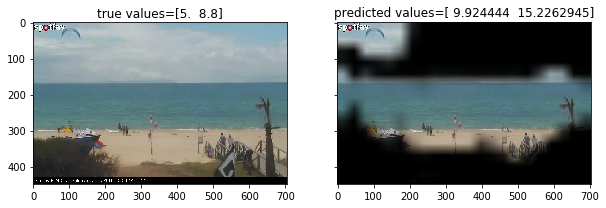

Incorrect! Error = 5.675369358062744
20 22


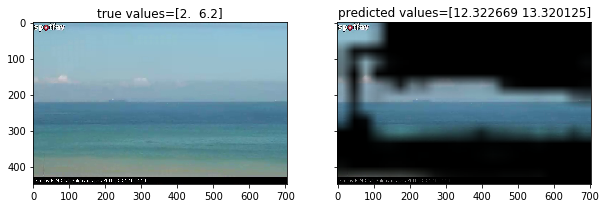

Incorrect! Error = 8.721396827697754
20 23


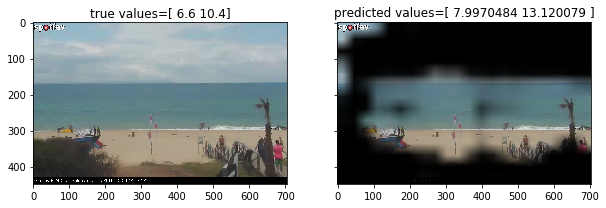

Correct! Error = 2.058563709259033
21 23


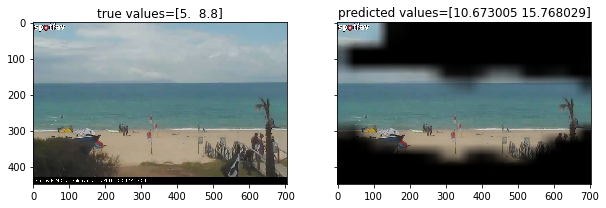

Incorrect! Error = 6.3205171585083
21 24


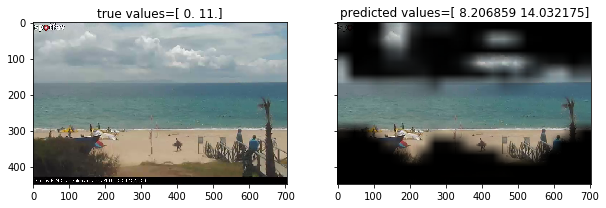

Incorrect! Error = 5.619516849517822
21 25


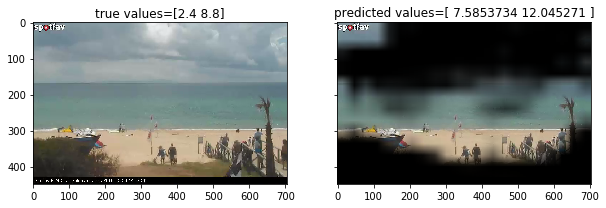

Correct! Error = 4.215322160720825
22 25


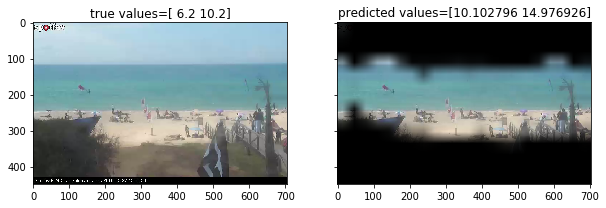

Correct! Error = 4.339860725402833
23 25


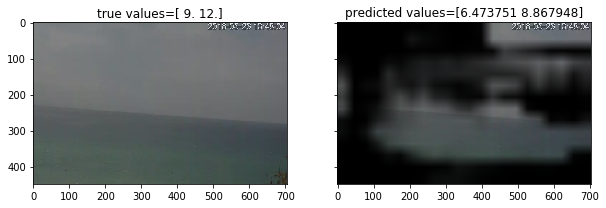

Correct! Error = 2.829150676727295
24 25


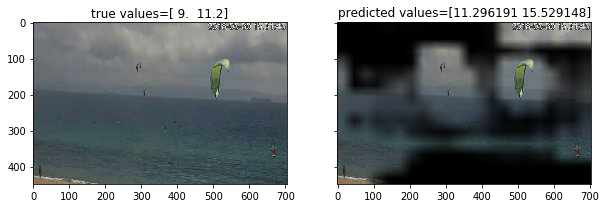

Correct! Error = 3.312669658660889
25 25


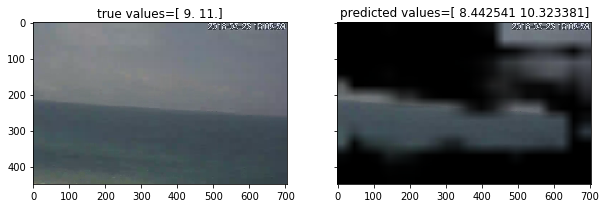

Correct! Error = 0.6170387268066406
26 25


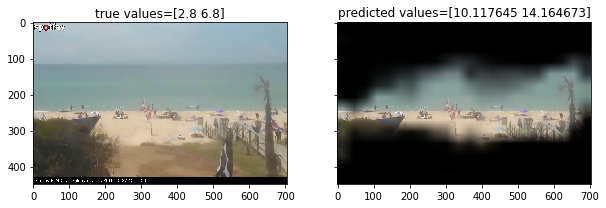

Incorrect! Error = 7.341159057617188
26 26


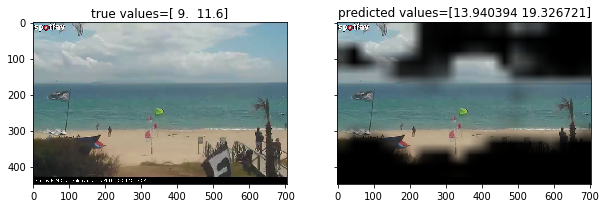

Incorrect! Error = 6.333557796478272
26 27


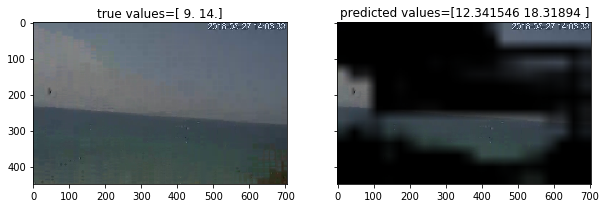

Correct! Error = 3.83024263381958
27 27


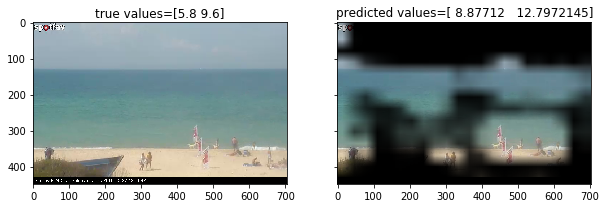

Correct! Error = 3.137167263031006
28 27


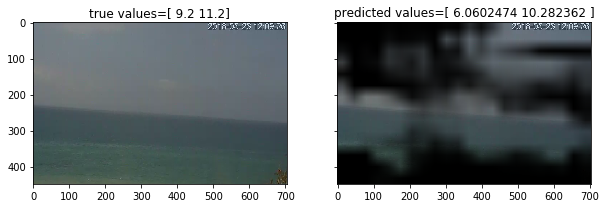

Correct! Error = 2.0286952972412102
29 27


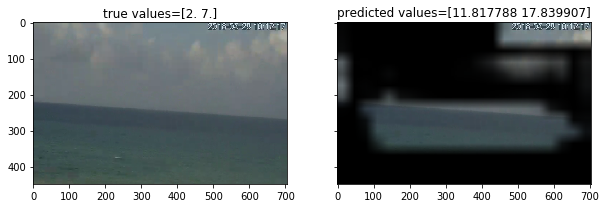

Incorrect! Error = 10.328847408294678
29 28


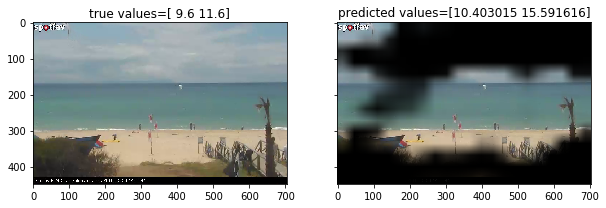

Correct! Error = 2.3973154067993168
30 28


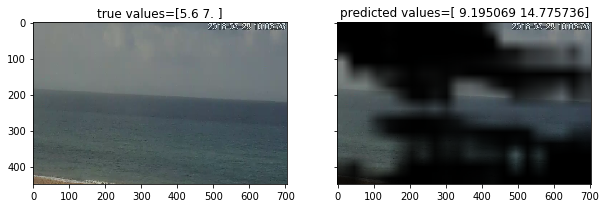

Incorrect! Error = 5.685402584075928
30 29


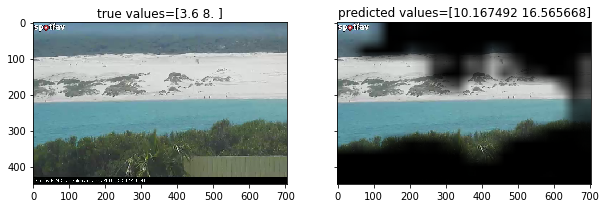

Incorrect! Error = 7.566580009460449
30 30


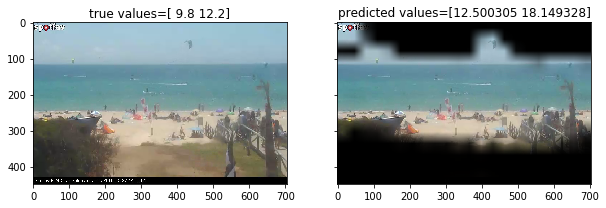

Correct! Error = 4.324816703796387
31 30


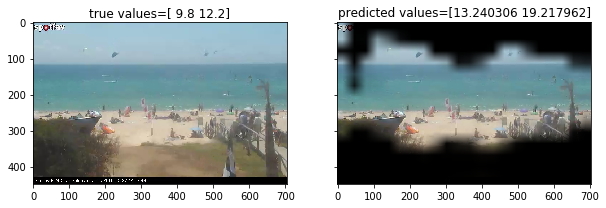

Incorrect! Error = 5.2291340827941895
31 31


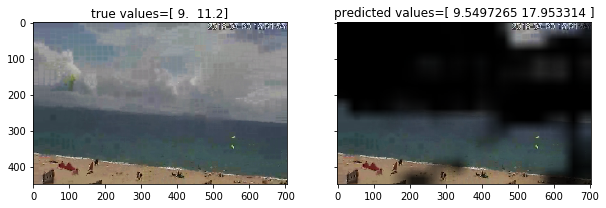

Correct! Error = 3.651520156860352
32 31


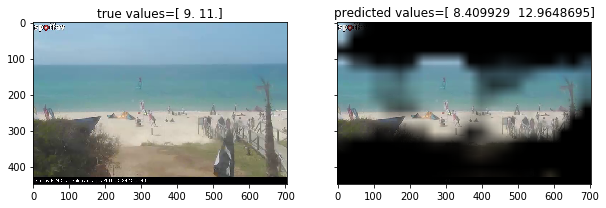

Correct! Error = 1.2774701118469238
33 31


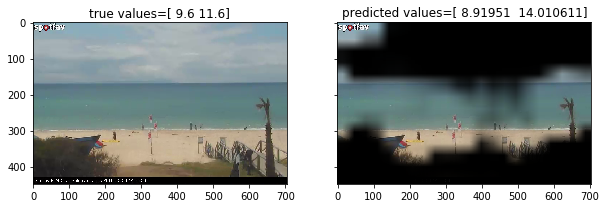

Correct! Error = 1.5455503463745117
34 31


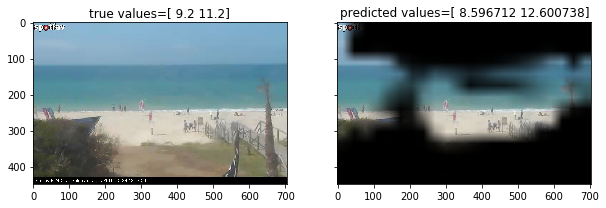

Correct! Error = 1.0020127296447754
35 31


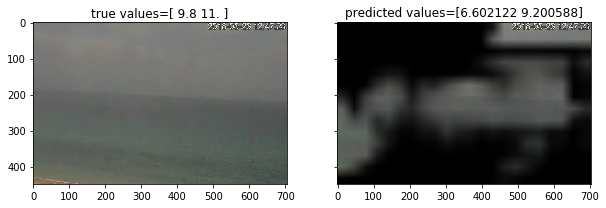

Correct! Error = 2.4986449718475345
36 31


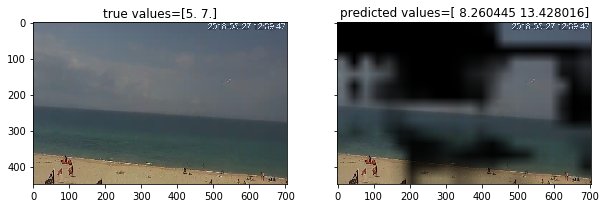

Correct! Error = 4.8442301750183105
37 31


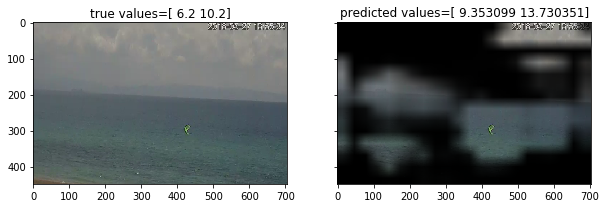

Correct! Error = 3.3417251586914065
38 31


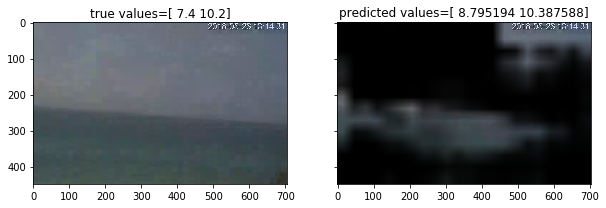

Correct! Error = 0.7913906097412111
39 31


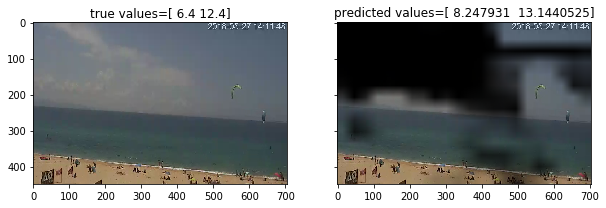

Correct! Error = 1.295991516113281
40 31


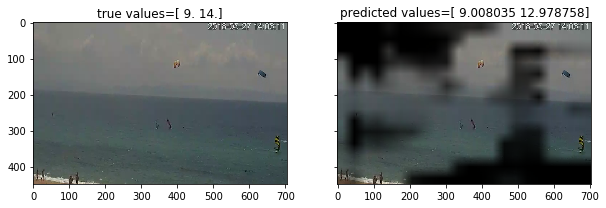

Correct! Error = 0.5146384239196777
41 31


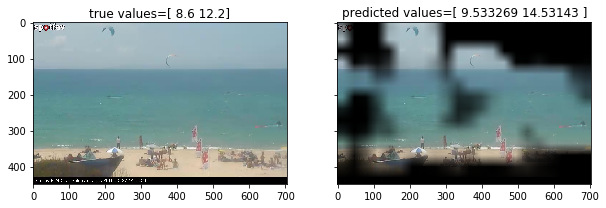

Correct! Error = 1.632349586486817
42 31


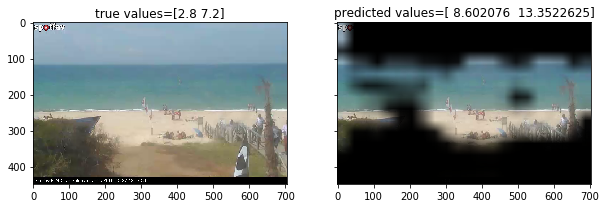

Incorrect! Error = 5.977169036865234
42 32


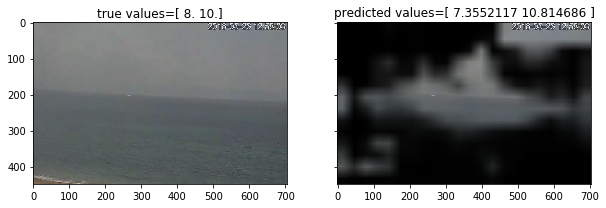

Correct! Error = 0.7297370433807373
43 32


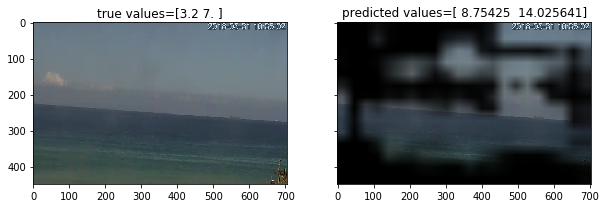

Incorrect! Error = 6.289945507049561
43 33


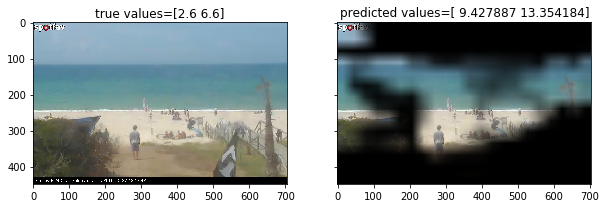

Incorrect! Error = 6.791035556793213
43 34


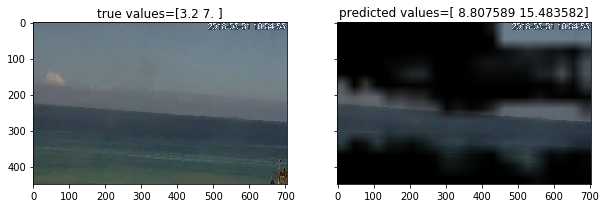

Incorrect! Error = 7.045585060119629
43 35


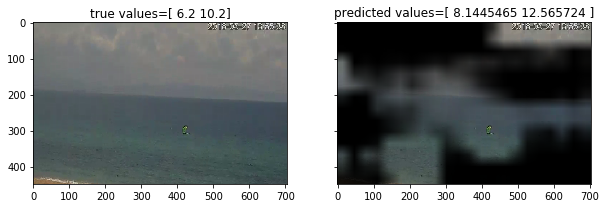

Correct! Error = 2.1551354408264163
44 35


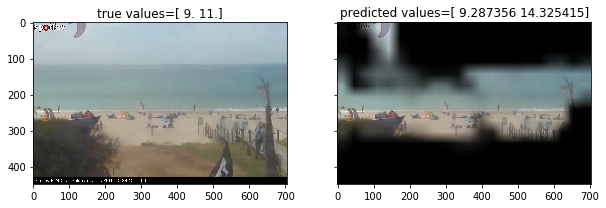

Correct! Error = 1.8063855171203613
45 35


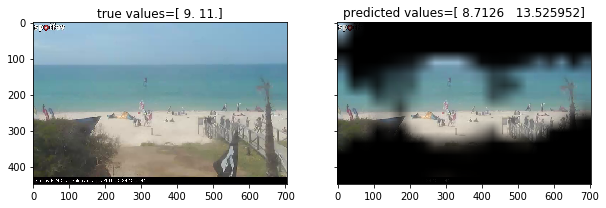

Correct! Error = 1.4066762924194336
46 35


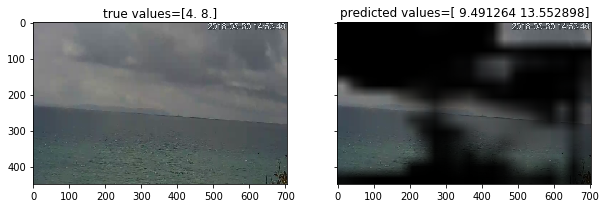

Incorrect! Error = 5.52208137512207
46 36


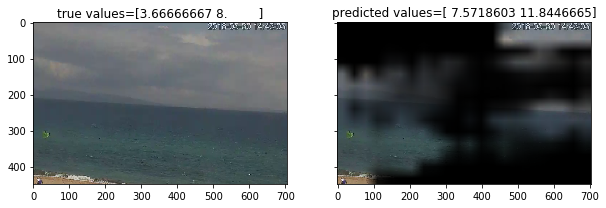

Correct! Error = 3.874930063883464
47 36


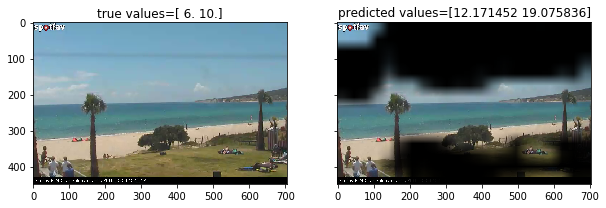

Incorrect! Error = 7.62364387512207
47 37


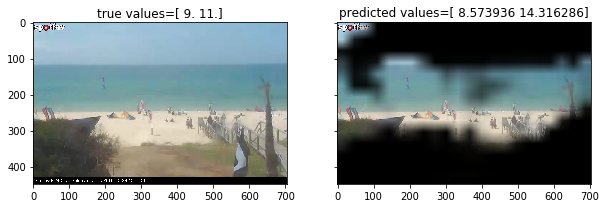

Correct! Error = 1.8711748123168945
48 37


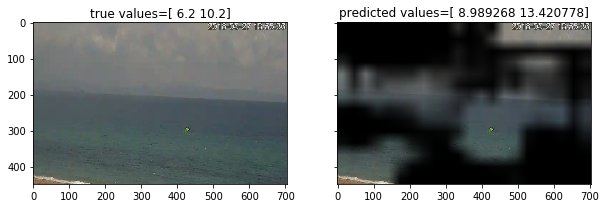

Correct! Error = 3.005023288726807
49 37


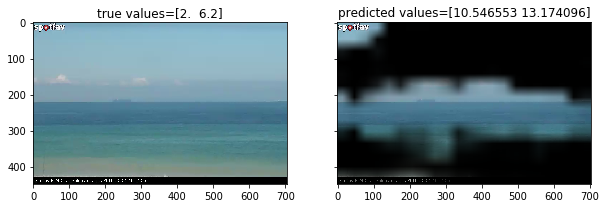

Incorrect! Error = 7.760324382781983
49 38


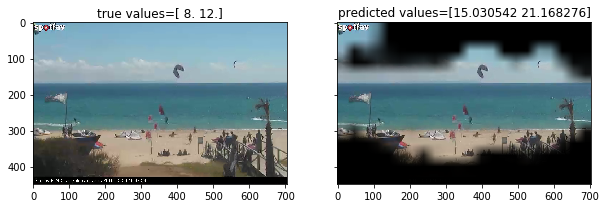

Incorrect! Error = 8.099409103393555
49 39


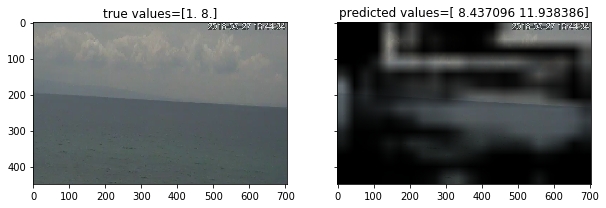

Incorrect! Error = 5.687740802764893
49 40


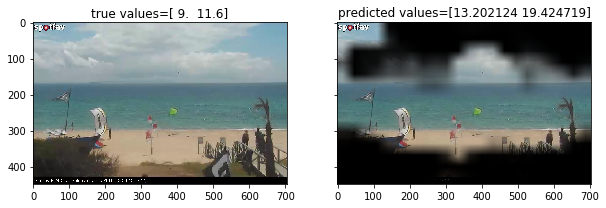

Incorrect! Error = 6.013421249389649
49 41


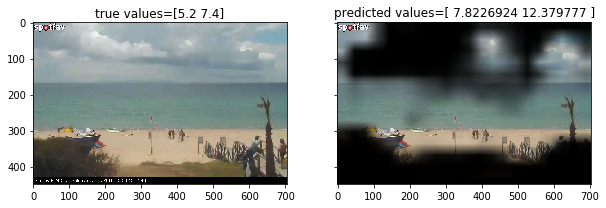

Correct! Error = 3.801234674453735
50 41


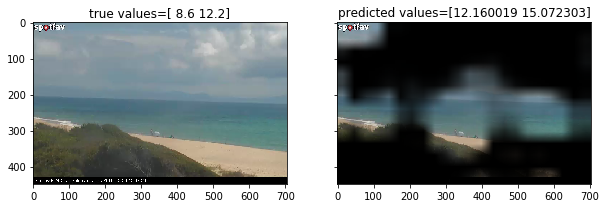

Correct! Error = 3.216160869598389
51 41


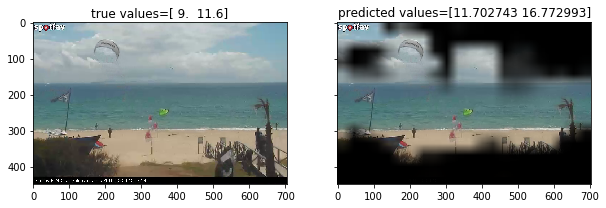

Correct! Error = 3.937867832183838
52 41


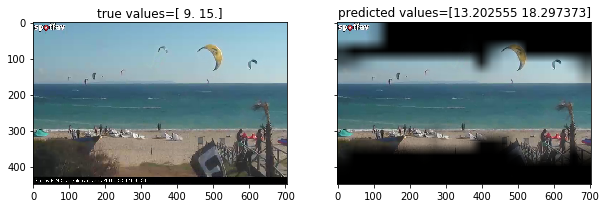

Correct! Error = 3.7499637603759766
53 41


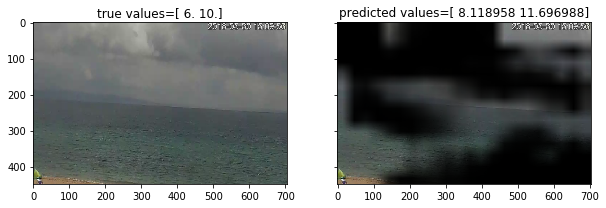

Correct! Error = 1.907973289489746
54 41


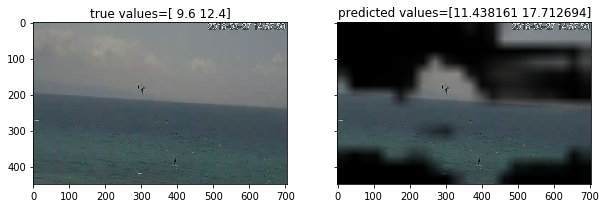

Correct! Error = 3.575427532196045
55 41


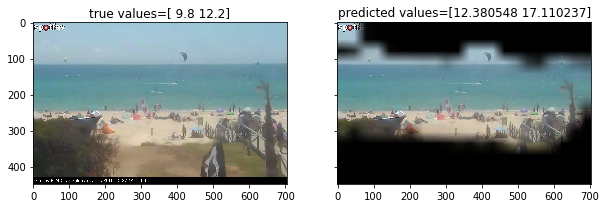

Correct! Error = 3.745392322540283
56 41


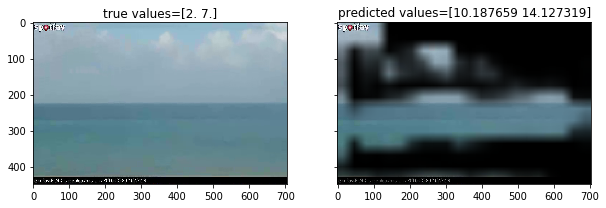

Incorrect! Error = 7.65748929977417
56 42


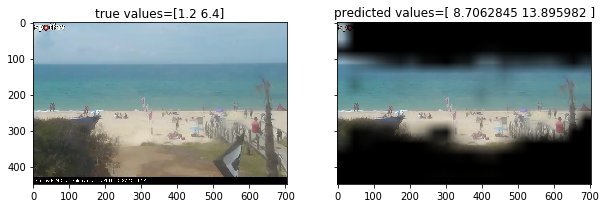

Incorrect! Error = 7.501133155822753
56 43


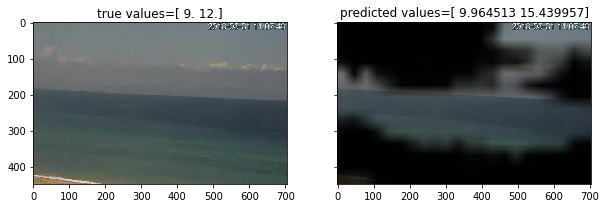

Correct! Error = 2.2022347450256348
57 43


In [107]:
gen=batch_gen(data_frame=df)
corr=0
incorr=0
for i in range(100):
    img,true_val=next(gen)
    prediction=test_model.predict(img)
    err=np.mean(np.abs(true_val-prediction[1]))
    
    #prediction1=stat_model.predict(img)
    maskedim=np.expand_dims(imresize(np.squeeze(prediction[0]),img[0].shape[0:2]),axis=-1)*img/255.
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,20))
    ax1.imshow(np.squeeze(img))
    ax2.imshow(maskedim[0])
    ax1.set_title('true values={}'.format(np.squeeze(true_val)))
    ax2.set_title('predicted values={}'.format(np.squeeze(prediction[1])))
    plt.show()
    if err<5.:
        corr+=1
        print('Correct! Error = {}'.format(err))
    else:
        incorr+=1
        print('Incorrect! Error = {}'.format(err))
    print(corr, incorr)

##### One can see that the accuracy is much lower now. Its just a bit more than 50%. This can be due to the fact that in the training set the samples with low wind values are singificantly underrepresented. The weighted loss can somewhat improve the situation making the model carefully look at such rare samples during training, since they have much higher weights. But it looks like it's not enough.